In [18]:
import typing
import warnings
import torch
import numpy as np
import numpy.typing as npt
import imageio
import cv2
import json
import os
from scipy.spatial.transform import Rotation as R

rot_psi = lambda phi: np.array([
        [1, 0, 0, 0],
        [0, np.cos(phi), -np.sin(phi), 0],
        [0, np.sin(phi), np.cos(phi), 0],
        [0, 0, 0, 1]])

rot_theta = lambda th: np.array([
        [np.cos(th), 0, -np.sin(th), 0],
        [0, 1, 0, 0],
        [np.sin(th), 0, np.cos(th), 0],
        [0, 0, 0, 1]])

rot_phi = lambda psi: np.array([
        [np.cos(psi), -np.sin(psi), 0, 0],
        [np.sin(psi), np.cos(psi), 0, 0],
        [0, 0, 1, 0],
        [0, 0, 0, 1]])

trans_t = lambda t: np.array([
        [1, 0, 0, t[0]],
        [0, 1, 0, t[1]],
        [0, 0, 1, t[2]],
        [0, 0, 0, 1]])

def sample_from_sphere_uniform(ndim: int, r: float) -> npt.NDArray[typing.Any]:
    """Samples a random point on the `ndim`-dimensional sphere of radius `r`.
    
    Exploits that a multivariate normal distribution is spherical in $\mathbb R^n$, then normalizes and scales by `r`.
    """
    out = np.zeros(ndim)
    while np.linalg.norm(out) == 0:
        out = np.random.randn(ndim)
    
    out /= np.linalg.norm(out)
    out *= r
    return out


def get_random_pose(d_min: float=3, d_max: float=5, t_min: float=0, t_max: float=0.5, clamp_uh: bool=True) -> npt.NDArray[typing.Any]:
    """Returns the transformation matrix (in homogeneous coordinates) for a random 6D starting pose.

    The pose is defined by a 3D rotation and a 3D translation.
    The rotation is sampled uniformly on SO(3) or its subset which results in a viewpoint in the upper hemisphere if `clamp_uh` is True.
    The translation along the z-axis (view axis, equivalent to distance from object) is sampled uniformly from [`d_min`, `d_max`].
    Translations along the x- and y-axis (orthogonal to view axis) are sampled uniformly from [`t_min`, `t_max`].
    """
    warnings.warn("Don't forget to seed numpy for reproducability when using this function.")
    # sample uniform rotation
    rotation = np.eye(4)
    rotation[:3, :3] = R.random().as_matrix()
    while clamp_uh and np.dot([0, 0, 1], np.dot(rotation[:3, :3], [0, 1, 0])) > 0:
        rotation[:3, :3] = R.random().as_matrix()

    # sample translation
    z = np.random.uniform(d_min, d_max, 1)
    xy = np.random.uniform(t_min, t_max, 2)
    translation = trans_t(np.concatenate([xy, z]))

    # rotate around origin, then translate
    pose = rotation @ translation
    return pose

In [7]:
rotation = np.eye(4)
rotation[:3, :3] = R.random().as_matrix()

In [15]:
rotation

array([[-0.25719023, -0.96218612, -0.08972767,  0.        ],
       [ 0.85655092, -0.18399188, -0.48214884,  0.        ],
       [ 0.44740776, -0.20086029,  0.87148232,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [13]:
np.dot(rotation, [0, 1, 0, 1])

array([-0.96218612, -0.18399188, -0.20086029,  1.        ])

In [14]:
np.dot([0, 1, 0, 1], rotation)

array([ 0.85655092, -0.18399188, -0.48214884,  1.        ])

In [19]:
arg = dict(
model_name = 'lego',
output_dir = './output',
dataset_type = 'blender',
data_dir = './data/nerf_synthetic/',
ckpt_dir = './ckpts',

use_viewdirs = True,
white_bkgd = True,
N_samples = 64,
N_importance = 64,
half_res = True,

obs_img_num = 2,
dil_iter = 3,
kernel_size = 5,
batch_size = 512,
lrate = 0.01,
sampling_strategy = 'random',

t_min = 0,
t_max = 1,

noise = None,
sigma = 0.01,
amount = 0.8,
delta_brightness = 0.,

no_ndc = False,
multires = 10,
i_embed = 0,
multires_views = 4,
raw_noise_std = 0,
render_factor = 0,
netdepth = 8,
netwidth = 256,
netdepth_fine = 8,
netwidth_fine = 256,
chunk = 1024*32,
netchunk = 1024*64,
perturb = 0,
lindisp = False)

class argcl:
    def __init__(self, arg):
        self.arg = arg

    def __getattr__(self, item):
        return self.arg[item]

args = argcl(arg)

In [20]:
import os
import torch
import imageio
import numpy as np
import skimage
import cv2
from utils import config_parser, load_blender, show_img, find_POI, img2mse, load_llff_data
from nerf_helpers import load_nerf
from render_helpers import render, to8b, get_rays
from inerf_helpers import camera_transf
import nerf_helpers
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_tensor_type('torch.cuda.FloatTensor')

if args.dataset_type == 'blender':
    obs_img, hwf, start_pose, obs_img_pose = load_blender(args.data_dir, args.model_name, args.obs_img_num,
                                            args.half_res, args.white_bkgd, t_min=args.t_min, t_max=args.t_max)
    H, W, focal = hwf
    near, far = 2., 6.  # Blender
else:
    obs_img, hwf, start_pose, obs_img_pose, bds = load_llff_data(args.data_dir, args.model_name, args.obs_img_num, factor=8, recenter=True, bd_factor=.75, spherify=spherify, t_min=t_min, t_max=t_max)
    H, W, focal = hwf
    H, W = int(H), int(W)
    if args.no_ndc:
        near = np.ndarray.min(bds) * .9
        far = np.ndarray.max(bds) * 1.
    else:
        near = 0.
        far = 1.

render_kwargs = load_nerf(args, device)
bds_dict = {
    'near': near,
    'far': far,
}
render_kwargs.update(bds_dict)

/mnt/c/Users/thadd/OneDrive/Dokumente/projects/inerf/utils.py:161: UserWarning: Don't forget to seed numpy for reproducability when using this function.
  warnings.warn("Don't forget to seed numpy for reproducability when using this function.")
/home/thadd/anaconda3/envs/inerf/lib/python3.8/site-packages/torch/cuda/__init__.py:104: UserWarning: 
NVIDIA GeForce RTX 3050 Ti Laptop GPU with CUDA capability sm_86 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_70.
If you want to use the NVIDIA GeForce RTX 3050 Ti Laptop GPU GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


RuntimeError: CUDA error: no kernel image is available for execution on the device

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


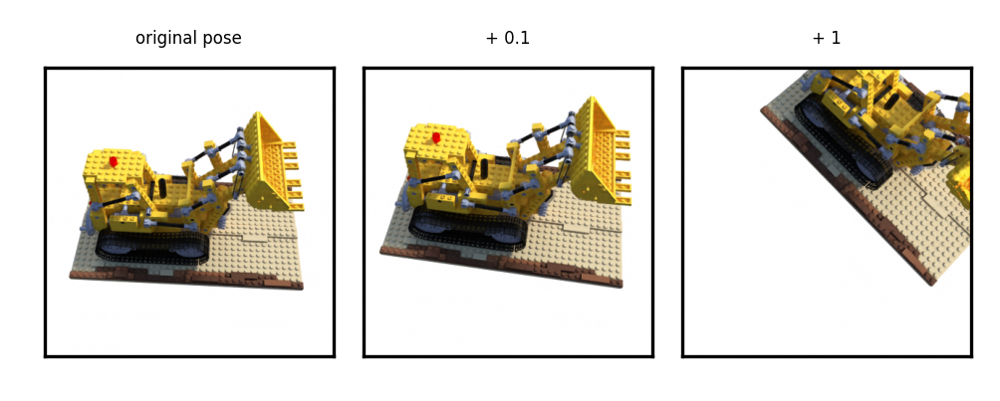

In [37]:
pose1 = obs_img_pose + \
    np.array([[0.1, 0, 0, 0],
              [0, 0.1, 0, 0],
              [0, 0, 0.1, 0.1],
              [0, 0, 0, 1]])

pose2 = obs_img_pose + \
    np.array([[1, 0, 0, 0],
              [0, 1, 0, 0],
              [0, 0, 1, 1],
              [0, 0, 0, 1]])

fig = plt.figure(figsize=(1*4, 3*4), dpi=300)
grid = ImageGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.1)
# plt.tick_params(axis='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)
grid[0].imshow(render(H, W, focal, chunk=args.chunk, c2w=torch.Tensor(obs_img_pose[:3, :4]).to(device), **render_kwargs)[0].cpu())
grid[1].imshow(render(H, W, focal, chunk=args.chunk, c2w=torch.Tensor(pose1[:3, :4]).to(device), **render_kwargs)[0].cpu())
grid[2].imshow(render(H, W, focal, chunk=args.chunk, c2w=torch.Tensor(pose2[:3, :4]).to(device), **render_kwargs)[0].cpu())

grid[0].set_title('original pose', fontsize=4)
grid[1].set_title('+ 0.1', fontsize=4)
grid[2].set_title('+ 1', fontsize=4)

for ax in grid:
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])
plt.show()

In [21]:
render_kwargs['far'] = 1
rgbs = []
obs_trans_dist = np.linalg.norm(obs_img_pose[:3, 3:])
for i in range(10):
    pose = torch.Tensor(get_random_pose(obs_trans_dist - 1, obs_trans_dist + 2)).to(device)
    rgbs.append(render(H, W, focal, chunk=args.chunk, c2w=pose[:3, :4], **render_kwargs)[0].cpu())

fig = plt.figure(figsize=(1*4, 10*4), dpi=300)
grid = ImageGrid(fig, 111, nrows_ncols=(1, 10), axes_pad=0.025)

for ax, im in zip(grid, rgbs):
    ax.imshow(im)
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])
plt.show()

NameError: name 'render_kwargs' is not defined

In [28]:
rgbs, titles = [], []
for i in np.arange(-1, 1.1, 0.1):
    pose_x = torch.Tensor(trans_t([i, 0, 0])).to(device)
    pose_y = torch.Tensor(trans_t([0, i, 0])).to(device)
    pose_z = torch.Tensor(trans_t([0, 0, i])).to(device)
    pose_psi = torch.Tensor(rot_psi(i * np.pi)).to(device)
    pose_theta = torch.Tensor(rot_theta(i * np.pi)).to(device)
    pose_phi = torch.Tensor(rot_phi(i * np.pi)).to(device)

    rgbs.append(render(H, W, focal, chunk=args.chunk, c2w=pose_x[:3, :4], **render_kwargs)[0].cpu())
    rgbs.append(render(H, W, focal, chunk=args.chunk, c2w=pose_y[:3, :4], **render_kwargs)[0].cpu())
    rgbs.append(render(H, W, focal, chunk=args.chunk, c2w=pose_z[:3, :4], **render_kwargs)[0].cpu())
    rgbs.append(render(H, W, focal, chunk=args.chunk, c2w=pose_psi[:3, :4], **render_kwargs)[0].cpu())
    rgbs.append(render(H, W, focal, chunk=args.chunk, c2w=pose_theta[:3, :4], **render_kwargs)[0].cpu())
    rgbs.append(render(H, W, focal, chunk=args.chunk, c2w=pose_phi[:3, :4], **render_kwargs)[0].cpu())

    titles.extend([f'x = {round(i, 1)}', f'y = {round(i, 1)}', f'z = {round(i, 1)}'])
    titles.extend([f'rot around x = {round(i * 180)}°', f'rot around y = {round(i * 180)}°', f'rot around z = {round(i * 180)}°'])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

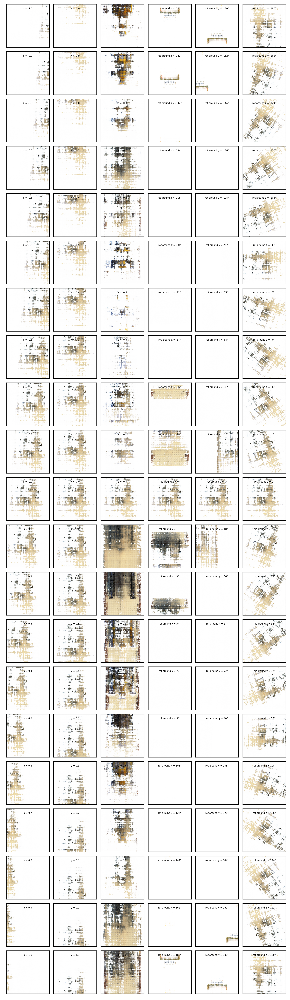

In [34]:
fig = plt.figure(figsize=(21*4, 6*4), dpi=300)
grid = ImageGrid(fig, 111, nrows_ncols=(21, 6), axes_pad=0.1)
# plt.tick_params(axis='both', bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False)
for ax, im, tit in zip(grid, rgbs, titles):
    ax.imshow(im)
    ax.set_title(tit, y=0.8, fontsize=4)
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])
fig.tight_layout()
# fig.subplots_adjust(top=0.95)
plt.show()
